# Ejercicios Unidad 1

1. Elija una de las imágenes color que tomó para la clase y aplique separación de canales y elija un método para transformarla en escala de grises. Muestre por pantalla los resultados obtenidos.
2. Con las fotografías pedidas por la cátedra la clase pasada (la foto de objetos con fondo liso, y fotos del mismo producto en un contexto más complejo) usar los métodos de extracción de características (esos anteriores al Deep Learning) para encontrar la ubicación del producto dentro de la imagen.
3. Para leer un paper, conviene arrancar leyendo el abstract, luego hacer una lectura por los títulos de las distintas secciones, prestar atención a las imágenes y su texto asociado, y leer con detalle la conclusión.
    
    Se dividirá la comisión completa en 5 grupos de dialogo, cada grupo tomará un paper diferente de los que se muestran en la sección “Técnicas de extracción de características mediante aprendizaje profundo.” Les proponemos hacer una primera lectura del mismo. Luego de la misma un par de valientes del grupo dará una breve presentación de los mismos.
    
    [01_superpoint.pdf](https://drive.google.com/file/d/1tx6GrL1Cr-LnQBSH1K9xffPxbasQugE9/view?usp=drive_web)
    
    [02_d2net.pdf](https://drive.google.com/file/d/1-b07QhWcRdQWYhZxQ6wY97KN_Oiu1M8L/view?usp=drive_web)
    
    [03_NeurIPS.pdf](https://drive.google.com/file/d/1su2irZiTg1brgTUaAGxgUquHzZDzp_7d/view?usp=drive_web)
    
    [04_liu2018.pdf](https://drive.google.com/file/d/1IQT7nKAHXQD7opxk7ws-mLok7NGdXe09/view?usp=drive_web)
    
    [05_Zhang_Deep_Graphical_Feature_Learning.pdf](https://drive.google.com/file/d/15mFrmQvKmCFX_WeFNYfticSOrOKcKVTL/view?usp=drive_web)
    
4. Con los videos de [youtube.com](http://youtube.com) de cámara fija pedidos para esta clase, aplicar los algoritmos de detección de movimiento vistos en la teoría.
5. (Entrega obligatoria individual en repo) Genere un video en un patio o en un hall de edificio donde en un principio se vea vacío y luego aparezca una persona. Mediante los métodos de motion detection (sin usar deep learning) logre una detección de la persona cuando entra al cuadro suponiendo la utilidad para una cámara de seguridad.
Luego sobre el mismo video aplique los algoritmos de flujo denso y disperso que se mostraron en clase.
Escriba una reflexión sobre los resultados en el formato md dentro del Jupyter Notebook.
6. (Entrega obligatoria individual en repo) Explique cuál es diferencia entre localización de objetos y clasificación de imágenes. Muestre ejemplos de ello.
7. Continuando con el ejercicio 3, de lectura de papers, les proponemos hacer una primera lectura de los siguientes papers. Luego de la misma otro par de valientes del grupo dará una breve presentación de los mismos. En total a cada grupo le tocará leer dos papers uno de cada ejercicio.
    1. **[LeNet-5](http://vision.stanford.edu/cs598_spring07/papers/Lecun98.pdf)**  (quienes tomaron el 1 del ejercicio 3)
    2. **[VGGNet](https://arxiv.org/abs/1409.1556)**  (quienes tomaron el 2 del ejercicio 3)
    3. **[GoogLeNet](https://arxiv.org/abs/1409.4842)**  (quienes tomaron el 3 del ejercicio 3)
    4. **[ResNet](https://arxiv.org/abs/1512.03385)**  (quienes tomaron el 4 del ejercicio 3)
    5. **[Transformers in Vision](https://arxiv.org/abs/2010.11929)**   (quienes tomaron el 5 del ejercicio 3)
8. (Entrega obligatoria individual en repo) En lo posible, realizar videos donde una clase de objeto difiera en número con otros objetos (sino, utilizar videos bajados de internet). Por ejemplo, al aire libre, un perro que se mueva entre personas en un parque. Una persona en bicicleta entre muchos autos en una calle de la ciudad. Luego, utilizar los distintos algoritmos presentados en teoría para detectar solo la clase minoritaria con su respectiva etiqueta. Indicando en cada caso la herramienta utilizada y comparando los niveles de confianza de detección logrados.
9. (Entrega obligatoria individual en repo) Tomar fotografías donde coexistan varios objetos en posiciones solapadas y no, en contextos de diferente complejidad. Luego, aplicar los algoritmos de segmentación propuestos y verificar los resultados de cada uno. Comentar qué diferencias observa.
10. Con el mismo video usado en el ejercicio 4, realice un seguimiento de objetos con el código propuesto en la sección de ejemplos prácticos.

#Descargar archivos

In [ ]:
import gdown

url = 'https://drive.google.com/drive/folders/1t9DAx0lR9QyTePIKtm4mUb2J3bItFII8?usp=sharing'

output = 'vpc'

#gdown.download(url, output, quiet=False)
gdown.download_folder(url, quiet=True, output='vpc')

filename_in = 'vpc/camara_patio.mp4'


#Ejercicio 1

Shape de la imagen: (1600, 1200, 3).
Columnas (Ancho): 1200
Filas (Altura): 1600
Canales: 3
Tipo de dato del array: uint8


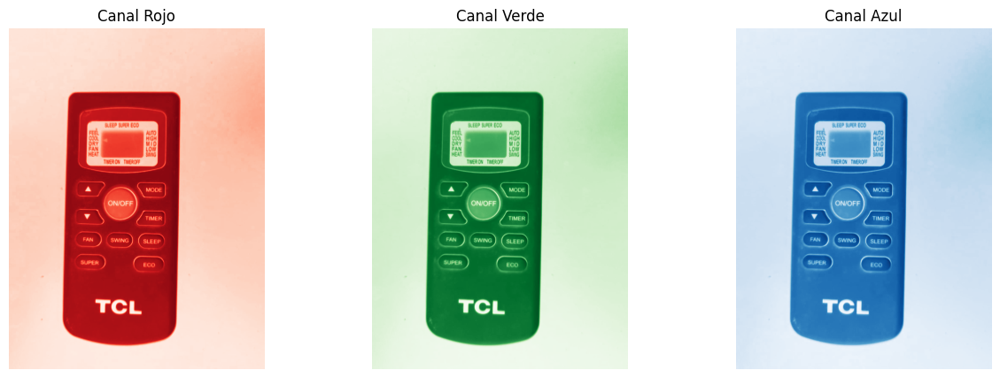

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

image = Image.open('vpc/control1.jpeg')

image_np = np.array(image)
print(f"Shape de la imagen: {image_np.shape}.")
print(f"Columnas (Ancho): {image_np.shape[1]}")
print(f"Filas (Altura): {image_np.shape[0]}")
print(f"Canales: {image_np.shape[2]}")
print(f"Tipo de dato del array: {image_np.dtype}")


R, G, B = image_np[:,:,0], image_np[:,:,1], image_np[:,:,2]


fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(R, cmap='Reds')
axs[0].set_title('Canal Rojo')
axs[0].axis('off')

axs[1].imshow(G, cmap='Greens')
axs[1].set_title('Canal Verde')
axs[1].axis('off')

axs[2].imshow(B, cmap='Blues')
axs[2].set_title('Canal Azul')
axs[2].axis('off')

plt.show()


Shape de la imagen original (RGB): (1600, 1200, 3)
Tipo de dato del array de la imagen original: uint8
Shape de la imagen en escala de grises: (1600, 1200)
Tipo de dato del array de la imagen en escala de grises: uint8


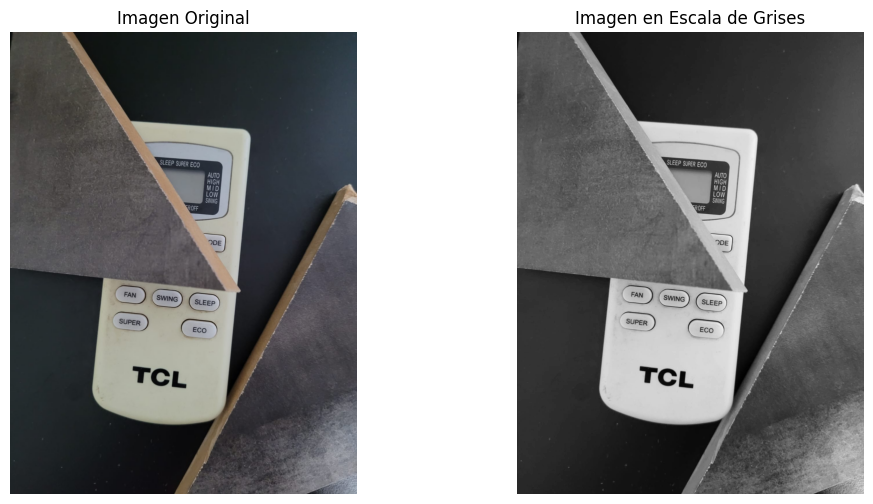

In [ ]:
image_color = cv2.imread('vpc/control4.jpeg')

image_rgb = cv2.cvtColor(image_color, cv2.COLOR_BGR2RGB)

# Convertir la imagen a escala de grises
image_gray = cv2.cvtColor(image_color, cv2.COLOR_BGR2GRAY)

# Imprimir el shape y el tipo de dato del array de la imagen original y en escala de grises
print(f"Shape de la imagen original (RGB): {image_rgb.shape}")
print(f"Tipo de dato del array de la imagen original: {image_rgb.dtype}")
print(f"Shape de la imagen en escala de grises: {image_gray.shape}")
print(f"Tipo de dato del array de la imagen en escala de grises: {image_gray.dtype}")

# Mostrar ambas imágenes, original y en escala de grises
plt.figure(figsize=(12, 6))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Imagen Original")
plt.axis('off')

# Imagen en escala de grises
plt.subplot(1, 2, 2)
plt.imshow(image_gray, cmap='gray')
plt.title("Imagen en Escala de Grises")
plt.axis('off')

plt.show()

#Ejercicio 2

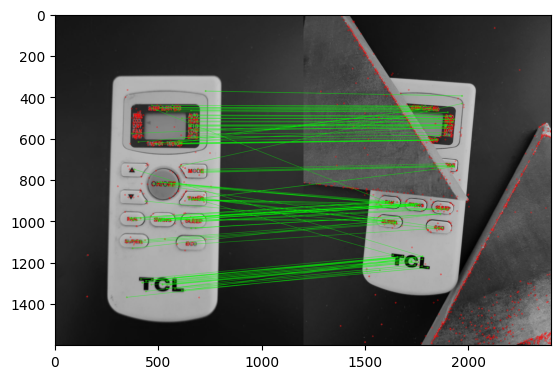

(<matplotlib.image.AxesImage at 0x7afd6d5f7ee0>, None)

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Cargar imágenes en escala de grises
img1 = cv.imread('vpc/control1.jpeg', cv.IMREAD_GRAYSCALE)          # Imagen de consulta (queryImage)
img2 = cv.imread('vpc/control4.jpeg', cv.IMREAD_GRAYSCALE) # Imagen de entrenamiento (trainImage)

# Iniciar el detector SIFT
sift = cv.SIFT_create()

# Encontrar los keypoints y descriptores con SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Parámetros FLANN
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)  # o pasar un diccionario vacío

# Iniciar FLANN matcher
flann = cv.FlannBasedMatcher(index_params, search_params)

# Realizar emparejamientos kNN
matches = flann.knnMatch(des1, des2, k=2)

# Necesitamos dibujar solo los buenos emparejamientos, por lo que creamos una máscara
matchesMask = [[0, 0] for i in range(len(matches))]

# Test de proporción según el artículo de Lowe
# https://www.robots.ox.ac.uk/~vgg/research/affine/det_eval_files/lowe_ijcv2004.pdf
for i, (m, n) in enumerate(matches):
    if m.distance < 0.7 * n.distance:
        matchesMask[i] = [1, 0]

# Parámetros de dibujo para los emparejamientos
draw_params = dict(matchColor=(0, 255, 0),  # color de los emparejamientos
                   singlePointColor=(255, 0, 0),  # color de los puntos individuales
                   matchesMask=matchesMask,  # máscara para seleccionar emparejamientos
                   flags=cv.DrawMatchesFlags_DEFAULT)

# Dibujar los emparejamientos kNN
img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, matches, None, **draw_params)

# Mostrar la imagen resultante
plt.imshow(img3), plt.show()

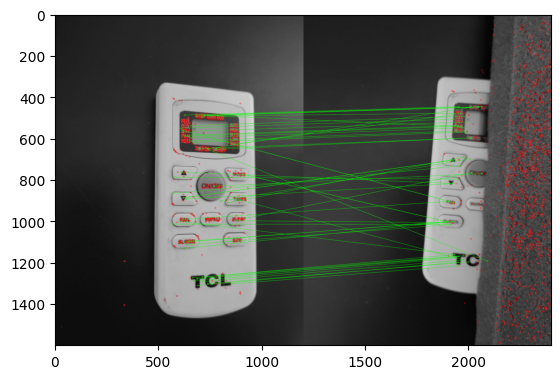

(<matplotlib.image.AxesImage at 0x7afd6d4ab550>, None)

In [ ]:
# Cargar imágenes en escala de grises
img1 = cv.imread('vpc/control2.jpeg', cv.IMREAD_GRAYSCALE)          # Imagen de consulta (queryImage)
img2 = cv.imread('vpc/control3.jpeg', cv.IMREAD_GRAYSCALE) # Imagen de entrenamiento (trainImage)

# Iniciar el detector SIFT
sift = cv.SIFT_create()

# Encontrar los keypoints y descriptores con SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Parámetros FLANN
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)  # o pasar un diccionario vacío

# Iniciar FLANN matcher
flann = cv.FlannBasedMatcher(index_params, search_params)

# Realizar emparejamientos kNN
matches = flann.knnMatch(des1, des2, k=2)

# Necesitamos dibujar solo los buenos emparejamientos, por lo que creamos una máscara
matchesMask = [[0, 0] for i in range(len(matches))]

# Test de proporción según el artículo de Lowe
# https://www.robots.ox.ac.uk/~vgg/research/affine/det_eval_files/lowe_ijcv2004.pdf
for i, (m, n) in enumerate(matches):
    if m.distance < 0.7 * n.distance:
        matchesMask[i] = [1, 0]

# Parámetros de dibujo para los emparejamientos
draw_params = dict(matchColor=(0, 255, 0),  # color de los emparejamientos
                   singlePointColor=(255, 0, 0),  # color de los puntos individuales
                   matchesMask=matchesMask,  # máscara para seleccionar emparejamientos
                   flags=cv.DrawMatchesFlags_DEFAULT)

# Dibujar los emparejamientos kNN
img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, matches, None, **draw_params)

# Mostrar la imagen resultante
plt.imshow(img3), plt.show()

#Ejercicio 5

##Deteccion por diferencia de frames

In [ ]:
#!pip install -q mediapy
import mediapy as media  # Importar la biblioteca mediapy para manejo de medios
import cv2  # Importar OpenCV para el procesamiento de imágenes y videos
import numpy as np


# Función para oscurecer una imagen:
def process_image(new_image, prev_image, **kwargs):
    # Convertir la imagen a float32
    new_image_float = new_image.astype(np.float32)

    # Reducir el brillo de la imagen a la mitad
    new_image_float *= 0.5

    # Convertir la imagen de vuelta a uint8
    new_image_uint8 = np.clip(new_image_float, 0, 255).astype(np.uint8)

    return new_image_uint8

def draw_contours(frame, contours, color=(0, 255, 0), thickness=2):
    # Comprobar si la imagen es en escala de grises (1 canal)
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        # Convertir la imagen de escala de grises a color (3 canales)
        result_image = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)
    else:
        # Si ya es una imagen de color, simplemente hacer una copia
        result_image = frame.copy()

    # Dibujar cada contorno en la imagen
    for contour in contours:
        # Obtener el rectángulo delimitador para cada contorno
        x, y, w, h = cv2.boundingRect(contour)
        # Dibujar el rectángulo
        cv2.rectangle(result_image, (x, y), (x + w, y + h), color, thickness)

    return result_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break


In [ ]:
# Función actualizada para detectar movimientos y dibujar cuadros delimitadores:
def process_frame_difference_full(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 30, 255, cv2.THRESH_BINARY)

    # Dilatar la imagen umbralizada para mejorar la detección de contornos
    kernel = np.ones((5,5),np.uint8)
    dilated = cv2.dilate(thresh, kernel, iterations = 1)

    # Convertir la imagen dilatada a formato adecuado para findContours
    dilated = dilated.astype(np.uint8)

    # Encontrar contornos en la imagen dilatada
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Dibujar cuadros delimitadores alrededor de los contornos
    if kwargs.get('draw_mode', 0) == 0:
      result_image = draw_contours(new_image, contours)
    elif kwargs.get('draw_mode', 0) == 1:
      result_image = draw_contours(thresh, contours)

    return result_image


filename_out = 'camara_patio_difference_full.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_frame_difference_full,
                max_time=10, draw_mode=1)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

# Llamar a la función para procesar el video
filename_out = 'camara_patio_difference_full.mp4'
video_processor(filename_in, filename_out, process_frame_difference_full,
                max_time=10, draw_mode=0)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

##Deteccion por flujo optimo

###Flujo Disperso

In [ ]:
import mediapy

def process_sparse_optical_flow(new_image, prev_image):
    # Preparamos las imagenes de trabajo
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
    prev_gray_image = cv2.cvtColor(prev_image, cv2.COLOR_BGR2GRAY)

    # Verificar si ya se han detectado las características de Shi-Tomasi
    if not hasattr(process_sparse_optical_flow, "shi_tomasi_done"):
        # Definir parámetros para la detección de esquinas de Shi-Tomasi
        feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7)
        # Detectar puntos característicos en la imagen
        process_sparse_optical_flow.prev_points = cv2.goodFeaturesToTrack(new_gray, mask=None, **feature_params)
        # Crear una máscara para dibujar el flujo óptico
        process_sparse_optical_flow.mask = np.zeros_like(new_image)
        # Marcar que se ha completado la detección de Shi-Tomasi
        process_sparse_optical_flow.shi_tomasi_done = True

    # Continuar si se ha completado la detección de Shi-Tomasi
    if process_sparse_optical_flow.shi_tomasi_done:
        prev_points = process_sparse_optical_flow.prev_points
        mask = process_sparse_optical_flow.mask

    # Parámetros para el flujo óptico de Lucas-Kanade
    lk_params = dict(winSize=(15, 15), maxLevel=2,
                     criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    # Calcular el flujo óptico de Lucas-Kanade
    new_points, status, error = cv2.calcOpticalFlowPyrLK(prev_gray_image, new_gray, prev_points, None, **lk_params)
    # Filtrar puntos buenos
    good_old = prev_points[status == 1]
    good_new = new_points[status == 1]
    color = (0, 255, 0)  # Color para el dibujo
    # Dibujar el movimiento (flujo óptico)
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.astype(int).ravel()
        c, d = old.astype(int).ravel()
        mask = cv2.line(mask, (a, b), (c, d), color, 2)
        new_image = cv2.circle(new_image, (a, b), 3, color, -1)

    # Combinar la imagen actual con las líneas de flujo óptico dibujadas
    output = cv2.add(new_image, mask)
    # Actualizar puntos para el siguiente cuadro
    process_sparse_optical_flow.prev_points = good_new.reshape(-1, 1, 2)
    return output

filename_out = 'camara_patio_sparse_optical_flow.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_sparse_optical_flow,
                max_time=10)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

###Flujo Denso

In [ ]:
# Función para procesar el flujo óptico denso
def process_dense_optical_flow(new_image, prev_image):
    # Convierte la nueva imagen a escala de grises
    gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)

    if not hasattr(process_dense_optical_flow, "init_done"):
        process_dense_optical_flow.prev_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
        process_dense_optical_flow.mask = np.zeros_like(new_image)
        process_dense_optical_flow.mask[..., 1] = 255
        process_dense_optical_flow.init_done = True

    if process_dense_optical_flow.init_done:
        prev_gray = process_dense_optical_flow.prev_gray
        mask = process_dense_optical_flow.mask

    # Calcula el flujo óptico
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    # Computa magnitud y ángulo de los vectores 2D
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    # Establece el tono de la imagen según la dirección del flujo óptico
    mask[..., 0] = angle * 180 / np.pi / 2
    # Establece el valor de la imagen según la magnitud del flujo óptico
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
    # Convierte de HSV a RGB
    rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)
    # Actualiza la imagen previa a gris
    process_dense_optical_flow.prev_grayprev_gray = gray.copy()
    return rgb

filename_out = 'camara_patio_dense_optical_flow.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_dense_optical_flow,
                max_time=20)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=30)

##Reflexión

***Detección de movimiento por diferecnia de frames:***

En la **detección de movimiento** cuando se ulilizo el método de diferencia de fotogramas resulto ser una técnica efectiva para identificar movimiento en el video. Al calcular la diferencia absoluta entre los fotogramas consecutivos y aplicar umbralización y dilatación, se pudo resaltar las regiones donde ocurrió el movimiento. Posteriormente, al encontrar y dibujar cuadros delimitadores alrededor de los contornos detectados, se obtuvo una representación de la actividad en el video.

Una de las principales ventajas es su simplicidad y eficiencia computacional. Sin embargo, la detección de movimiento basada únicamente en la diferencia de fotogramas puede ser susceptible a falsos positivos (como se logra ver en el video), especialmente en situaciones donde hay cambios en la iluminación o movimiento del fondo. Se logra ver en el video pequeños recuadros debido a pequeños movimientos de la planta o de partes dentro de la persona.


***Deteccion de movimiento por flujo óptimo:***

La aplicación de algoritmos de **flujo óptico**, tanto disperso como denso, agregó una dimensión adicional al análisis del movimiento en el video. El flujo óptico disperso permitió detectar y rastrear puntos característicos a lo largo de los fotogramas, proporcionando información sobre la dirección y la magnitud del movimiento en esos puntos. Se detectan puntos que no tienen que ver con la persona en movimiento.

Por otro lado, el flujo óptico denso, generó una visualización más completa del movimiento en todo el cuadro, asignando vectores de flujo a cada píxel. Esto ofreció una representación detallada de cómo cambia el contenido del video a lo largo del tiempo. Se ven ciertos errores en los colores en el seguimiento de la persona.

***Conclusion:***

Al analizar los resultados de ambas técnicas, es evidente que cada una tiene sus fortalezas y debilidades. La detección de movimiento es rápida y fácil de implementar, pero puede ser menos precisa en escenarios complejos. Por otro lado, el flujo óptico proporciona una comprensión más detallada del movimiento, pero puede ser más intensivo en términos computacionales.

#Ejercicio 6

***Diferencia entre localización de objetos y clasificación de imágenes:***

La principal diferencia es que en la clasificación de imágenes se centra en asignar una etiqueta general a toda la imagen, la localización de objetos se trata de detectar y delimitar la ubicación precisa de los objetos dentro de la imagen.

La clasificación de imágenes consiste en asignar una etiqueta o categoría a una imagen completa. El objetivo es determinar qué objetos o escenas están presentes en la imagen y asignarle una etiqueta correspondiente a cada una de ellas.

Por otro lado, la localización de objetos trata de identificar y delimitar la ubicación de uno o varios objetos dentro de una imagen. Además de clasificar los objetos presentes, la tarea implica también proporcionar información sobre la ubicación exacta de dichos objetos en la imagen.

**Ejemplos:**

**Clasificación de Imágenes:**

Dado un conjunto de imágenes de animales que incluye gatos, perros y pájaros, un modelo de clasificación de imágenes podría predecir que una imagen particular contiene un perro.

Un modelo de clasificación de imágenes entrenado para reconocer frutas puede identificar si una imagen contiene una manzana, una naranja o una banana.

Un sistema de clasificación de imágenes puede determinar si una fotografía pertenece a una playa, un bosque o una montaña basándose en las características visuales presentes en la imagen.

**Localización de Objetos:**

Utilizando un modelo de detección de objetos, se puede identificar y delimitar la ubicación de los rostros de las personas en una imagen.

Un modelo de detección de objetos puede identificar y delimitar la ubicación de los automóviles en una imagen de tráfico urbano.

Un sistema de seguridad puede utilizar la localización de objetos para detectar la presencia de personas en una habitación y señalar su ubicación exacta en un video de vigilancia.



#Ejercicio 8

In [2]:
%%capture
# Instalar la biblioteca pytube
!pip install pytube
!apt update && apt install -y handbrake

from pytube import YouTube

# URL del video de YouTube
url_perro = 'https://www.youtube.com/watch?v=kVgT8QNIuu8'

# Crear un objeto YouTube
yt = YouTube(url_perro)

# Seleccionar el stream con resolución de 720p
video = yt.streams.filter(progressive=True, file_extension='mp4', res="720p").first()

# Nombre del archivo de salida
output_filename = 'perro.mp4'

# Descargar el video con el nombre especificado
video.download(filename=output_filename)

print("Descarga completada.")

In [3]:
#Esto convierte el video a un formato más liviano de trabajo
!ffmpeg -y -i perro.mp4 -vf "scale=600:-1" -an -t 30 perro30.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [4]:
%pip install ultralytics
# Librería mediapy para mostrar videos
%pip install -q mediapy
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.2 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.1/107.7 GB disk)


In [5]:
!yolo predict model=yolov8n.pt source='perro30.mp4' save=True project=perro_yolov8

100% 6.23M/6.23M [00:00<00:00, 108MB/s]
Ultralytics YOLOv8.2.2 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

video 1/1 (frame 1/750) /content/perro30.mp4: 384x640 (no detections), 393.7ms
video 1/1 (frame 2/750) /content/perro30.mp4: 384x640 1 person, 1 handbag, 232.6ms
video 1/1 (frame 3/750) /content/perro30.mp4: 384x640 8 persons, 308.1ms
video 1/1 (frame 4/750) /content/perro30.mp4: 384x640 7 persons, 1 bench, 1 handbag, 1 skateboard, 197.9ms
video 1/1 (frame 5/750) /content/perro30.mp4: 384x640 9 persons, 1 skateboard, 235.8ms
video 1/1 (frame 6/750) /content/perro30.mp4: 384x640 9 persons, 1 bird, 132.3ms
video 1/1 (frame 7/750) /content/perro30.mp4: 384x640 9 persons, 1 bench, 1 dog, 135.8ms
video 1/1 (frame 8/750) /content/perro30.mp4: 384x640 10 persons, 1 bench, 1 dog, 141.4ms
video 1/1 (frame 9/750) /content/perro30.mp4: 384x640 8 persons, 1 bench, 1 dog, 1 horse, 138.7ms
video 1/

In [7]:
# Convertimos a MP4 para comprimir el video y optimizar el uso de memoria para la reproducción con mediapy
%%capture
!ffmpeg -i 'perro_yolov8/predict/perro30.avi' -vcodec libx264 'perro_yolov8/predict/perro30.mp4' -y

In [8]:
import mediapy as media
url = 'perro_yolov8/predict/perro30.mp4'
video = media.read_video(url)
media.show_video(video)

In [9]:
%%capture
!wget -O 'MobileNetSSD_deploy.prototxt' https://raw.githubusercontent.com/TheNsBhasin/DNN_Object_Detection/master/MobileNetSSD_deploy.prototxt.txt
!wget -O 'MobileNetSSD_deploy.caffemodel' https://github.com/TheNsBhasin/DNN_Object_Detection/blob/master/MobileNetSSD_deploy.caffemodel?raw=true


#Ejercicio 9

## Instance Segmentation con Mask R-CNN (OpenCV)

In [13]:
%%capture
!wget http://download.tensorflow.org/models/object_detection/mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar zxvf mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mscoco_labels.names -O mscoco_labels.names
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/colors.txt -O colors.txt
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt -O mask_rcnn_inception_v2_coco_2018_01_28.pbtxt


Inferencia con el modelo Mask R-CNN preentrenado

In [16]:
import numpy as np
import cv2 as cv
import time
import random
from matplotlib import pyplot as plt

# Umbral de confianza para las detecciones
confThreshold = 0.5
# Umbral para las máscaras de segmentación
maskThreshold = 0.3

# Cargar los nombres de las clases de MSCOCO
classesFile = "mscoco_labels.names"
classes = None
with open(classesFile, 'rt') as f:
    classes = f.read().rstrip('\n').split('\n')

# Cargar los colores para visualizar las detecciones
colorsFile = "colors.txt"
colors = []
with open(colorsFile, 'rt') as f:
    colorsStr = f.read().rstrip('\n').split('\n')
    for i in range(len(colorsStr)):
        rgb = colorsStr[i].split(' ')
        color = np.array([float(rgb[0]), float(rgb[1]), float(rgb[2])])
        colors.append(color)

# Archivos de configuración y pesos del modelo Mask R-CNN
textGraph = "./mask_rcnn_inception_v2_coco_2018_01_28.pbtxt"
modelWeights = "./mask_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb"

# Cargar la red
net = cv.dnn.readNetFromTensorflow(modelWeights, textGraph)
net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)

# Cargar la imagen y obtener sus dimensiones
image = cv.imread('objetos1.jpeg')
(H, W) = image.shape[:2]

# Crear un blob de la imagen y realizar una pasada hacia adelante con Mask R-CNN
blob = cv.dnn.blobFromImage(image, swapRB=True, crop=False)
net.setInput(blob)
start = time.time()
(boxes, masks) = net.forward(["detection_out_final", "detection_masks"])
end = time.time()

# Información de tiempo y formas de las detecciones y máscaras
print("[INFO] Mask R-CNN tomó {:.6f} segundos en procesar la imagen".format(end - start))
print("[INFO] Forma de boxes: {}".format(boxes.shape))
print("[INFO] Forma de masks: {}".format(masks.shape))


[INFO] Mask R-CNN tomó 9.899813 segundos en procesar la imagen
[INFO] Forma de boxes: (1, 1, 100, 7)
[INFO] Forma de masks: (100, 90, 15, 15)


Visualización de máscaras y bounding boxes

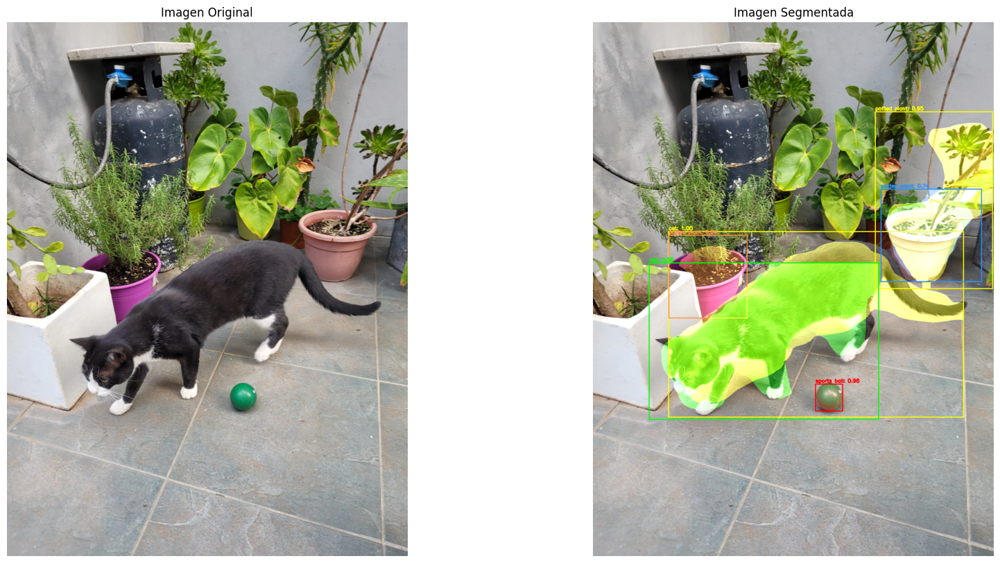

In [17]:
# Creamos una copia de la imagen original, para dibujar las máscaras
output_image = image.copy()

for i in range(0, boxes.shape[2]):
    confidence = boxes[0, 0, i, 2]
    if confidence > confThreshold:
        classId = int(boxes[0, 0, i, 1])
        box = boxes[0, 0, i, 3:7] * np.array([W, H, W, H])
        (startX, startY, endX, endY) = box.astype("int")

        # Redimensiona la máscara para que se ajuste a la caja delimitadora y la convierte en uint8
        mask = masks[i, classId]
        mask = cv.resize(mask, (endX - startX, endY - startY))
        mask = (mask > maskThreshold).astype("uint8")

        # Extrae la región de interés (ROI) usando las coordenadas de la caja delimitadora
        roi = output_image[startY:endY, startX:endX]

        # Crea una imagen de color sólido para la máscara
        color = random.choice(colors)
        color_mask = np.zeros_like(roi)
        color_mask[mask == 1] = color

        # Mezcla la imagen de color con la ROI utilizando la máscara
        roi = cv.addWeighted(roi, 1, color_mask, 0.4, 0)

        # Vuelve a colocar la ROI en la imagen original
        output_image[startY:endY, startX:endX] = roi

        # Dibuja la caja delimitadora
        cv.rectangle(output_image, (startX, startY), (endX, endY), color, 2)

        # Consigue el nombre de la clase y el color correspondiente
        classId = int(boxes[0, 0, i, 1])
        className = classes[classId]

        # Dibuja el rectángulo de la caja delimitadora y la etiqueta de la clase
        label = f"{className}: {confidence:.2f}"
        cv.rectangle(output_image, (startX, startY), (endX, endY), color, 2)
        cv.putText(output_image, label, (startX, startY - 5), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)


# Configurar los subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Mostrar la imagen original
axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axes[0].set_title('Imagen Original')
axes[0].axis('off')  # Ocultar los ejes

# Mostrar la imagen segmentada
axes[1].imshow(cv.cvtColor(output_image, cv.COLOR_BGR2RGB))
axes[1].set_title('Imagen Segmentada')
axes[1].axis('off')  # Ocultar los ejes

# Mostrar ambas imágenes
plt.show()



## Instance Segmentation con modelo PointRend Resnet50 (PixelLib)

In [18]:
%%capture
!pip install pixellib torchvision
# Instance segmentation model
!wget "https://github.com/ayoolaolafenwa/PixelLib/releases/download/0.2.0/pointrend_resnet50.pkl" -O pointrend_resnet50.pkl

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


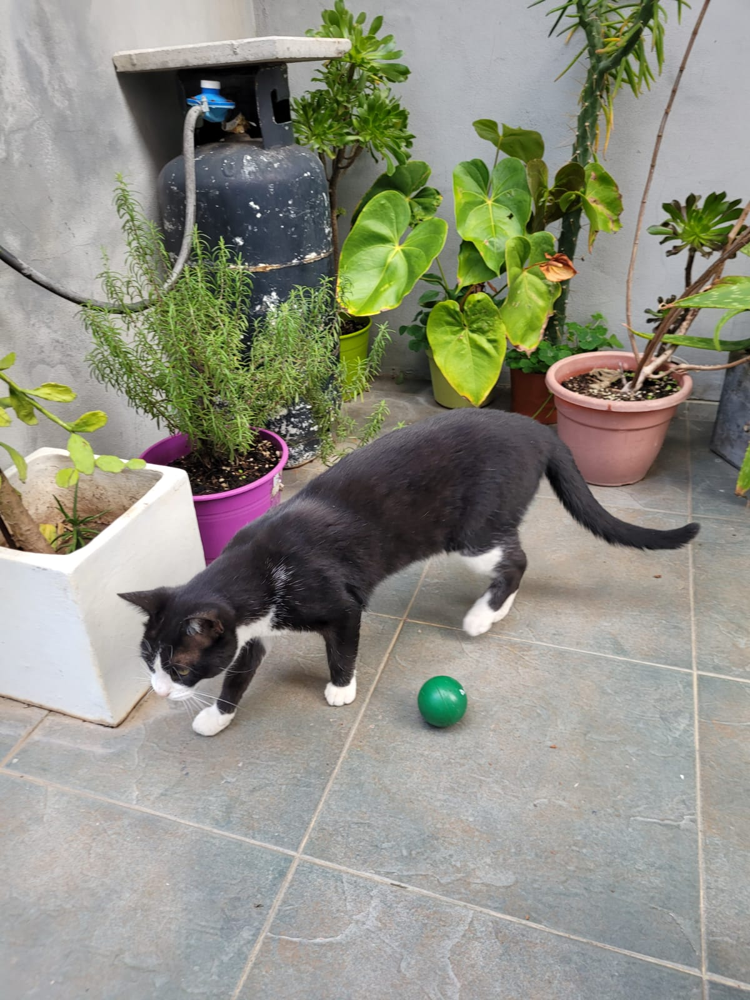

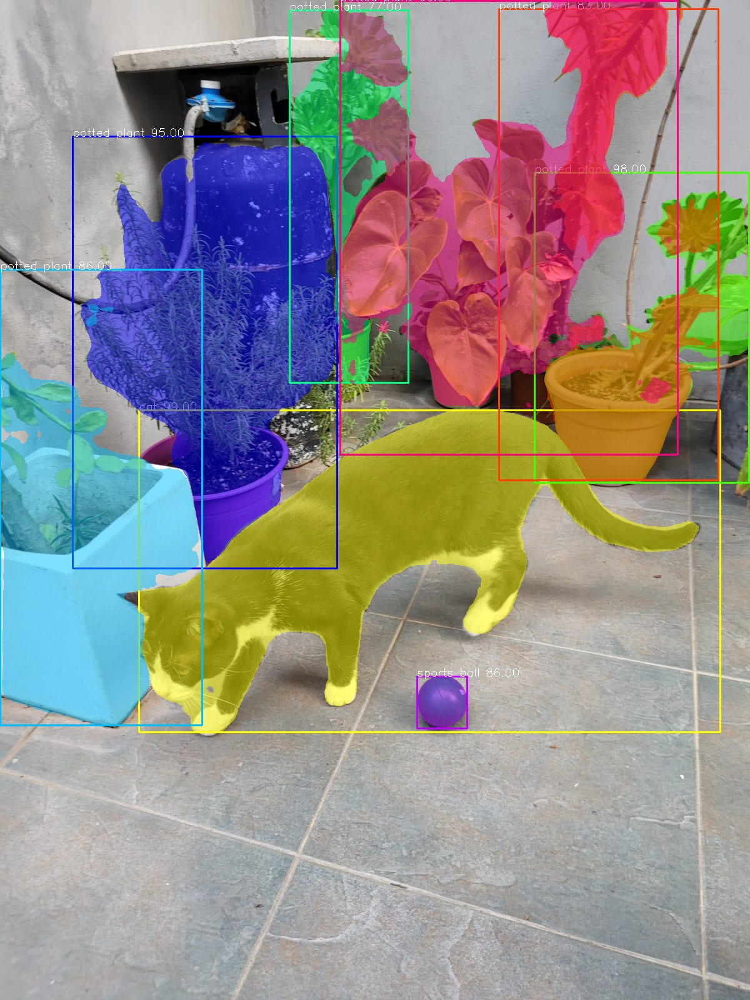

In [19]:
# Instalación de la biblioteca PixelLib
# !pip install pixellib

# Importación de las bibliotecas necesarias
import pixellib
from pixellib.torchbackend.instance import instanceSegmentation
from IPython.display import Image

# Creación de una instancia del modelo de segmentación
ins = instanceSegmentation()

# Carga del modelo preentrenado
ins.load_model("pointrend_resnet50.pkl")

# Segmentación de la imagen y guardado de la imagen segmentada con las cajas delimitadoras
ins.segmentImage("objetos1.jpeg", show_bboxes=True, output_image_name="objetos1_segmented.jpeg")

# Muestra la imagen original
display(Image(filename="objetos1.jpeg"))

# Muestra la imagen segmentada
display(Image(filename="objetos1_segmented.jpeg"))


## Semantic Segmentation con modelo DeepLabV3 (Torchvision)

In [20]:
%%capture
!pip install torchvision
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
model.eval()

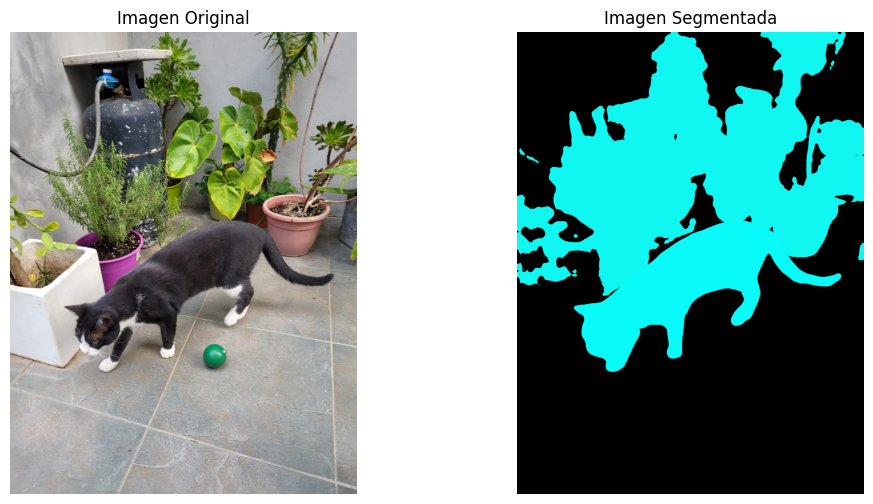

In [21]:
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import torch

# Carga y procesa la imagen
input_image = Image.open("objetos1.jpeg").convert("RGB").convert("RGB")

preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)  # crea un mini-batch como espera el modelo

# Mueve el input y el modelo a GPU para mayor velocidad si está disponible
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)['out'][0]
output_predictions = output.argmax(0)

# Crea una paleta de colores, seleccionando un color para cada clase
palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
colors = (colors % 255).numpy().astype("uint8")

# Genera la imagen de segmentación semántica
r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
r.putpalette(colors)

# Muestra la imagen original y la segmentada lado a lado
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, primer subplot
plt.imshow(input_image)
plt.title('Imagen Original')
plt.axis('off')  # Oculta los ejes

plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, segundo subplot
plt.imshow(r)
plt.title('Imagen Segmentada')
plt.axis('off')  # Oculta los ejes

plt.show()


## Panoptic segmentation con modelo DETR ResNet50 (Transformers)

Modelo: https://huggingface.co/facebook/detr-resnet-50-panoptic

In [39]:
%%capture
!pip install timm

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/models/detr/feature_extraction_detr.py:38: FutureWarning: The class DetrFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DetrImageProcessor instead.
  warnings.warn(


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50-panoptic were not used when initializing DetrForSegmentation: ['detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
`post_process_panoptic is deprecated and will be removed in v5 o

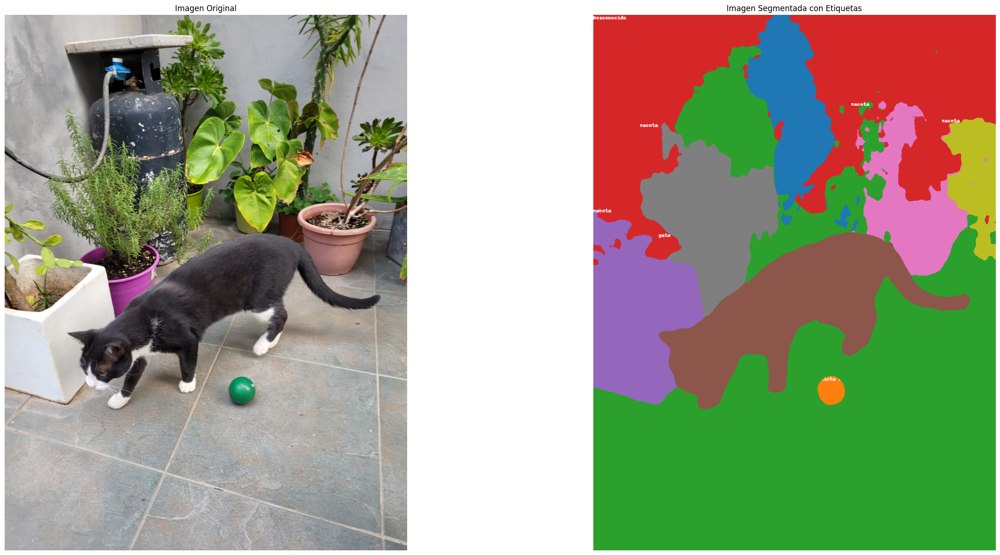

In [1]:
import io
import requests
from PIL import Image, ImageDraw, ImageFont
import torch
import numpy as np
import matplotlib.pyplot as plt
import itertools
import seaborn as sns
from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id

# Cargar la imagen
url = "https://raw.githubusercontent.com/matterport/Mask_RCNN/master/images/7933423348_c30bd9bd4e_z.jpg"
image = Image.open('/content/objetos1.jpeg')

# Cargar el modelo y el extractor de características
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

# Preparar la imagen para el modelo
inputs = feature_extractor(images=image, return_tensors="pt")

# Paso forward
outputs = model(**inputs)

# Postprocesamiento
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.85)[0]

# Convertir la segmentación a numpy
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg_id = rgb_to_id(panoptic_seg)

# Preparar la paleta de colores
palette = itertools.cycle(sns.color_palette())

# Crear la imagen segmentada
segmented_image = Image.fromarray(np.zeros_like(panoptic_seg, dtype=np.uint8))
draw = ImageDraw.Draw(segmented_image)

# Añadimos un mapeo manual de los IDs de las categorías a los nombres, basado en las clases comunes de COCO
COCO_LABELS = {
    1: 'persona', 2: 'bicicleta', 3: 'coche', 4: 'motocicleta', 5: 'avión',
    6: 'autobús', 7: 'tren', 8: 'camión', 9: 'barco', 10: 'semáforo',
    11: 'hidrante', 13: 'señal de stop', 14: 'parquímetro', 15: 'banco', 16: 'pájaro',
    17: 'gato', 18: 'perro', 19: 'caballo', 20: 'oveja', 21: 'vaca',
    22: 'elefante', 23: 'oso', 24: 'cebra', 25: 'jirafa', 27: 'mochila',
    28: 'paraguas', 31: 'bolso de mano', 32: 'corbata', 33: 'maleta', 34: 'frisbee',
    36: 'tabla de snowboard', 37: 'pelota deportiva', 38: 'cometa', 39: 'bate de béisbol',
    40: 'guante de béisbol', 41: 'patineta', 42: 'tabla de surf', 43: 'raqueta de tenis',
    44: 'botella', 46: 'plato de vino', 47: 'taza', 48: 'tenedor', 49: 'cuchillo',
    50: 'cuchara', 51: 'tazón', 52: 'banana', 53: 'manzana', 54: 'sándwich',
    55: 'naranja', 56: 'brócoli', 57: 'zanahoria', 58: 'perrito caliente', 59: 'pizza',
    60: 'donut', 61: 'pastel', 62: 'silla', 63: 'sofá', 64: 'maceta', 65: 'cama',
    67: 'mesa de comedor', 70: 'inodoro', 72: 'TV', 73: 'computadora portátil', 74: 'ratón',
    75: 'control remoto', 76: 'teclado', 77: 'teléfono celular', 78: 'microondas',
    79: 'horno', 80: 'tostadora', 81: 'fregadero', 82: 'refrigerador', 84: 'libro',
    85: 'reloj', 86: 'florero', 87: 'tijeras', 88: 'oso de peluche', 89: 'secador de pelo',
    90: 'cepillo de dientes',
}

# Ajusta el bucle para dibujar segmentos y etiquetas correctamente
for segment_info in result["segments_info"]:
    class_id = segment_info["category_id"]
    class_name = COCO_LABELS.get(class_id, 'Desconocido')  # 'Desconocido' si el ID no está en el diccionario
    id = segment_info["id"]

    # Generar la máscara para este segmento específico
    mask = panoptic_seg_id == id
    color = np.array(next(palette)) * 255  # Convertir el color a un array de numpy adecuado

    # Convertir la máscara a una imagen de PIL para usarla como máscara en 'paste'
    mask_image = Image.fromarray((mask * 255).astype(np.uint8))

    # Crear una imagen del color del segmento que tenga las dimensiones correctas
    color_image = Image.new("RGB", segmented_image.size, color=tuple(color.astype(int)))

    # Pegar usando la máscara para aplicar solo este segmento
    segmented_image.paste(color_image, (0,0), mask=mask_image)

    # Dibujar el nombre de la clase en la posición inicial del segmento
    draw = ImageDraw.Draw(segmented_image)
    where = np.where(mask)
    if where[0].size > 0 and where[1].size > 0:
        x, y = np.min(where[1]), np.min(where[0])
        draw.text((x, y), class_name, fill='white')

# Mostrar la imagen original y la segmentada
plt.figure(figsize=(30, 15))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)
plt.title('Imagen Segmentada con Etiquetas')
plt.axis('off')

plt.show()
